In [23]:
## IMport libraries

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from pandas import read_excel
from pandas import read_csv
from numpy import percentile
import itertools
from matplotlib.backends.backend_pdf import PdfPages
# Use seaborn style defaults and set the default figure size
sns.set(rc={'figure.figsize':(20, 10)})



In [ ]:
df=pd.read_csv('FGO Shutdown_DATA.csv')
df1= pd.read_csv('Airflow_level_masspull.csv', header=0, parse_dates=[0], index_col=0, squeeze=True)
df2= pd.read_csv('Chemical_add_variables.csv', header=0, parse_dates=[0], index_col=0, squeeze=True)
df3= pd.read_csv('Cyclone_feed_size.csv', header=0, parse_dates=[0], index_col=0, squeeze=True)
df4= pd.read_csv('Additional_masspull_variable.csv', header=0, parse_dates=[0], index_col=0, squeeze=True)
df5= pd.read_csv('Extra_variable_data.csv', header=0, parse_dates=[0], index_col=0, squeeze=True)
df6= pd.read_csv('GT_and_sagmill_Data.csv', header=0, parse_dates=[0], index_col=0, squeeze=True)


In [ ]:
## Making copy of dataframe

df_m=df1.copy()
df_n=df2.copy()
df_o=df3.copy()
df_p=df4.copy()
df_q=df5.copy()
df_r=df6.copy()


In [ ]:
df.columns

# Removing Shutdown Period

In [ ]:
length=len(df['Start'])
for i in range(length):
    start_remove = df['Start'][i]
    end_remove = df['Stop'][i]
    df5=df5.loc[(df5.index < start_remove) | (df5.index > end_remove)]

In [ ]:
df6.to_csv('Extra_variable_data_WSD.csv')

# Ressampling Data

In [ ]:
NumericDtype(df5)
#NumericDtype(df6)

In [ ]:
by_time1=df5.resample('H').mean()
#by_time2=df6.resample('H').mean()

In [ ]:
by_time1.to_csv('Extra_variable_data_WSD_Hour.csv')
#by_time2.to_csv('GT_and_sagmill_Data_WSD_Hour.csv')

# Reading Files for further analysis

In [93]:
df1= pd.read_csv('Airflow_level_masspull_WSD_Day.csv', header=0, parse_dates=[0], index_col=0, squeeze=True)
df2= pd.read_csv('Chemical_add_variables_WSD_Day.csv', header=0, parse_dates=[0], index_col=0, squeeze=True)
df3= pd.read_csv('Cyclone_feed_size_WSD_Day.csv', header=0, parse_dates=[0], index_col=0, squeeze=True)
df4= pd.read_csv('Additional_masspull_variable_WSD_Day.csv', header=0, parse_dates=[0], index_col=0, squeeze=True)
df5= pd.read_csv('Extra_variable_data_WSD_Day.csv', header=0, parse_dates=[0], index_col=0, squeeze=True)
df6= pd.read_csv('GT_and_sagmill_Data_WSD_Day.csv', header=0, parse_dates=[0], index_col=0, squeeze=True)


In [94]:
## Making copy of dataframe

df_m=df1.copy()
df_n=df2.copy()
df_o=df3.copy()
df_p=df4.copy()
df_q=df5.copy()
df_r=df6.copy()

In [95]:
## Function for changing data type to numric

def NumericDtype(dataframe):
    columns1=list(dataframe)
    for i in columns1:
        dataframe[i]=pd.to_numeric(dataframe[i], errors='coerce')
        dataframe[i] = dataframe[i].dropna()
    return;

In [96]:
NumericDtype(df_m)
NumericDtype(df_n)
NumericDtype(df_o)
NumericDtype(df_p)
NumericDtype(df_q)
NumericDtype(df_r)

In [75]:
df_m.isnull().sum()

FGO:TK1551:LIC4074-MODE         8737
FGO:TK1551:LIC4074-OP            700
FGO:TK1551:LIC4074-PV            700
FGO:TK1551:LIC4074-SP            700
FGO:TK1552:LIC4077-MODE         8737
FGO:TK1552:LIC4077-OP            700
FGO:TK1552:LIC4077-PV            700
FGO:TK1552:LIC4077-SP            700
FGO:TK1553:LIC4080-MODE         8737
FGO:TK1553:LIC4080-OP            700
FGO:TK1553:LIC4080-PV            701
FGO:TK1553:LIC4080-SP            700
FGO:TK1554:LIC4083-MODE         8737
FGO:TK1554:LIC4083-OP            700
FGO:TK1554:LIC4083-PV            700
FGO:TK1554:LIC4083-SP            700
FGO:TK1555:LIC4086-MODE         8737
FGO:TK1555:LIC4086-OP            700
FGO:TK1555:LIC4086-PV            707
FGO:TK1555:LIC4086-SP            700
FGO:TK1551:FIC4070-MODE         8737
FGO:TK1551:FIC4070-OP            700
FGO:TK1551:FIC4070-PV            733
FGO:TK1551:FIC4070-SP            700
FGO:TK1552:FIC4075-MODE         8737
FGO:TK1552:FIC4075-OP            700
FGO:TK1552:FIC4075-PV            700
F

In [122]:
by_time1=df_m.resample('D').mean()
by_time2=df_n.resample('D').mean()
by_time3=df_o.resample('D').mean()
by_time4=df_p.resample('D').mean()
by_time5=df_q.resample('D').mean()
by_time6=df_r.resample('D').mean()

In [ ]:
by_time1.to_csv('Airflow_level_masspull_WSD_DAY.csv')
by_time2.to_csv('Chemical_add_variables_WSD_DAY.csv')
by_time3.to_csv('Cyclone_feed_size_WSD_DAY.csv')
by_time4.to_csv('Additional_masspull_variable_WSD_DAY.csv')
by_time5.to_csv('Extra_variable_data_WSD_DAY.csv')
by_time6.to_csv('GT_and_sagmill_Data_WSD_DAY.csv')

In [ ]:
df_m.columns

In [97]:
def select_columns(data_frame, column_names):
    new_frame = data_frame.loc[:, column_names]
    new_frame.append(new_frame)
    return new_frame

In [ ]:
df_m.columns

In [98]:
selected_columns1 = [ 'FGO:TK1551:LIC4074-OP',
       'FGO:TK1551:LIC4074-PV', 'FGO:TK1551:LIC4074-SP',
     'FGO:TK1552:LIC4077-OP',
       'FGO:TK1552:LIC4077-PV', 'FGO:TK1552:LIC4077-SP',
        'FGO:TK1553:LIC4080-OP',
       'FGO:TK1553:LIC4080-PV', 'FGO:TK1553:LIC4080-SP',
        'FGO:TK1554:LIC4083-OP',
       'FGO:TK1554:LIC4083-PV', 'FGO:TK1554:LIC4083-SP',
        'FGO:TK1555:LIC4086-OP',
       'FGO:TK1555:LIC4086-PV', 'FGO:TK1555:LIC4086-SP',
        'FGO:TK1551:FIC4070-OP',
       'FGO:TK1551:FIC4070-PV', 'FGO:TK1551:FIC4070-SP',
        'FGO:TK1552:FIC4075-OP',
       'FGO:TK1552:FIC4075-PV', 'FGO:TK1552:FIC4075-SP',
        'FGO:TK1553:FIC4078-OP',
       'FGO:TK1553:FIC4078-PV', 'FGO:TK1553:FIC4078-SP',
        'FGO:TK1554:FIC4081-OP',
       'FGO:TK1554:FIC4081-PV', 'FGO:TK1554:FIC4081-SP',
        'FGO:TK1555:FIC4084-OP',
       'FGO:TK1555:FIC4084-PV', 'FGO:TK1555:FIC4084-SP','FGO:FGOMASSPULL:WIC5401-OP',
       'FGO:FGOMASSPULL:WIC5401-PV', 'FGO:FGOMASSPULL:WIC5401-SP']
selected_columns2 = ['FGO:SN1002:AIC4010-OP',
       'FGO:SN1002:AIC4010-PV', 'FGO:SN1002:AIC4010-SP','FGO:TK1550:DIC4058-OP',
       'FGO:TK1550:DIC4058-PV', 'FGO:TK1550:DIC4058-SP','FGO:TK1550:FIC4063-OP',
       'FGO:TK1550:FIC4063-PV', 'FGO:TK1550:FIC4063-SP','FGO:TK1550:FIC4095-OP',
       'FGO:TK1550:FIC4095-PV', 'FGO:TK1550:FIC4095-SP','FGO:TK1552:FIC8469-OP',
       'FGO:TK1552:FIC8469-PV', 'FGO:TK1552:FIC8469-SP','FGO:TK1553:FIC4089-OP', 
       'FGO:TK1553:FIC4089-PV','FGO:TK1553:FIC4089-SP','FGO:PU1109:FIT4214-PV',
        'PPO:COLLECTOR:FIT4050', 'FGO:PU1109:FIC4214-OP', 'FGO:PU1109:FIC4214-PV',
       'FGO:PU1109:FIC4214-SP','FGO:PU1108:FIC8467-OP', 'FGO:PU1108:FIC8467-PV',
        'FGO:PU1108:FIC8467-SP','FGO:PU1107:FIC4211-OP', 'FGO:PU1107:FIC4211-PV',
       'FGO:PU1107:FIC4211-SP', 'FGO:PU1109:FFC4214-ACT','FGO:PU1109:FFC4214-SP']
selected_columns3 = ['FGO:PU1011:DC4002_RO3',
       'FGO:PU1011:DI4002A_RO1','PGR:CIDRA_FGO:AIC8520-OP', 'PGR:CIDRA_FGO:AIC8520-PV',
       'PGR:CIDRA_FGO:AIC8520-SP','PGR:CY1001:DIC4003-OP', 'PGR:CY1001:DIC4003-PV',
       'PGR:CY1001:DIC4003-SP']
selected_columns4 = [ 'FGO:MX1550:FIC4056-OP','FGO:PU1750:WY4056_MPULL_A', 'FGO:PU1750:WY4056_MPULL_B',
       'FGO:PU1750:WY4056_MPULL_C',
       'FGO:MX1550:FIC4056-PV', 'FGO:MX1550:FIC4056-SP','FGO:MX1551:FIC5400-OP',
       'FGO:MX1551:FIC5400-PV', 'FGO:MX1551:FIC5400-SP','FGO:PU1750:WC4056_RO2','FGO:PU1760_61:DI5400']
selected_columns5 = ['PGR:LIC6751-OP', 'PGR:LIC6751-PV', 'PGR:LIC6751-SP',
        'PGR:LIC6755-OP', 'PGR:LIC6755-PV',
       'PGR:LIC6755-SP', 'PCR:TK2001:FI6163','PPO:COLLECTOR:FIT4009', 'PFL:PU3700:FIT5380',
       'FGO:PU1748:FIC4058-OP',
       'FGO:PU1748:FIC4058-PV', 'FGO:PU1748:FIC4058-SP', 'FGO:PU1748:DI4059',
       'FGO:PU1748:DI4059_PS-Density %',
       'PGR:TK2010:FIC6755-OP', 'PGR:TK2010:FIC6755-PV',
       'PGR:TK2010:FIC6755-SP', 
       'PGR:TK2007:FIC6751-OP', 'PGR:TK2007:FIC6751-PV',
       'PGR:TK2007:FIC6751-SP']
selected_columns6 = ['PGR:T-TK2007:GT1_TOT_FED', 'PGR:T-TK2008:GT1_TOT_FLW',
       'PGR:T-TK2010:GT2_TOT_FED', 'PGR:T-TK2011:GT2_TOT_FLW', 'PGR:LI6760',
       'PGR:LI6783','FGO:CV1005:WIC4133-OP', 'FGO:CV1005:WIC4133-PV',
       'FGO:CV1005:WIC4133-SP','FGO:GM1001_POWER', 'FGO:GM1002-KW','FGO:PU1011:FIC4001-OP', 'FGO:PU1011:FIC4001-PV',
       'FGO:PU1011:FIC4001-SP']


In [99]:
new1 = select_columns(df_m, selected_columns1)
new2 = select_columns(df_n, selected_columns2)
new3 = select_columns(df_o, selected_columns3)
new4 = select_columns(df_p, selected_columns4)
new5 = select_columns(df_q, selected_columns5)
new6 = select_columns(df_r, selected_columns6)


In [100]:
def filter_cols(df):
    df.drop([col for col in df.columns if "-MODE" in col], axis=1, inplace=True)
    df.drop([col for col in df.columns if "-SP" in col], axis=1, inplace=True)
    df.drop([col for col in df.columns if "-OP" in col], axis=1, inplace=True)
    df.drop([col for col in df.columns if "-OPT" in col], axis=1, inplace=True)
    df.drop([col for col in df.columns if "-SPT" in col], axis=1, inplace=True)
    

In [101]:
filter_cols(new1)
filter_cols(new2)
filter_cols(new3)
filter_cols(new4)
filter_cols(new5)
filter_cols(new6)

In [102]:
Airf_Desc = read_excel('FGO_Variable_description.xlsx', sheet_name = 'Airflow_level')
Chem_Desc = read_excel('FGO_Variable_description.xlsx', sheet_name = 'Chemical_addition')
Cycl_Desc = read_excel('FGO_Variable_description.xlsx', sheet_name = 'Cyclone_feed size')
Addmass_Desc = read_excel('FGO_Variable_description.xlsx', sheet_name = 'Additional Masspull variable')
Extr_Desc = read_excel('FGO_Variable_description.xlsx', sheet_name = 'Extra_variable')
GTSAG_Desc = read_excel('FGO_Variable_description.xlsx', sheet_name = 'GT and SAG mill')

In [103]:
new1.columns = new1.columns.map(Airf_Desc.set_index('Name')['LABEL'].get)
new2.columns = new2.columns.map(Chem_Desc.set_index('Name')['LABEL'].get)
new3.columns = new3.columns.map(Cycl_Desc.set_index('Name')['LABEL'].get)
new4.columns = new4.columns.map(Addmass_Desc.set_index('Name')['LABEL'].get)
new5.columns = new5.columns.map(Extr_Desc.set_index('Name')['LABEL'].get)
new6.columns = new6.columns.map(GTSAG_Desc.set_index('Name')['LABEL'].get)

In [13]:
new1.columns

Index(['FGO TK1551 Level Ctr PV - mm', 'FGO TK1552 Level Ctr PV - mm',
       'FGO TK1553 Level Ctr PV - mm', 'FGO TK1554 Level Ctr PV - mm',
       'FGO TK1555 Level Ctr SP - mm', 'TK1551 Air Blower Flow Loop PV - m3/h',
       'TK1552 Air Blower Flow Loop PV - m3/h',
       'TK1553 Air Blower Flow Loop PV - m3/h',
       'TK1554 Air Blower Flow Loop PV - m3/h',
       'TK1555 Air Blower Flow Loop PV - m3/h', 'FGO Mass Pull % PV - %'],
      dtype='object')

In [104]:
df_merge=[new1,new2,new3, new4, new5,new6]
df_comb = pd.concat(df_merge, axis=1)



In [131]:
#df_comb.to_csv('Combined_data_Daily.csv')

In [44]:
df_trial=df_comb.copy()

In [18]:
df_trial.columns

Index(['FGO TK1551 Level Ctr PV - mm', 'FGO TK1552 Level Ctr PV - mm',
       'FGO TK1553 Level Ctr PV - mm', 'FGO TK1554 Level Ctr PV - mm',
       'FGO TK1555 Level Ctr SP - mm', 'TK1551 Air Blower Flow Loop PV - m3/h',
       'TK1552 Air Blower Flow Loop PV - m3/h',
       'TK1553 Air Blower Flow Loop PV - m3/h',
       'TK1554 Air Blower Flow Loop PV - m3/h',
       'TK1555 Air Blower Flow Loop PV - m3/h', 'FGO Mass Pull % PV - %',
       'pH Indication for FGO - PV -  pH',
       'FGO FLTS FD TNK DNSTY CONTROL MEAS -  %(PS)',
       'Collector Added To TK1550 PV -  m3/h',
       'FGO FLTS FD TNK WTR FLW CONTROL MEAS -  m3/hr',
       'PAX Flow to TK1552/3 Controller PV -  L/H',
       'TK1553  Dithop Flow loop PV -  m3/h',
       'Total Promoter Flow to FGO Floats PV -  L/h',
       'FLOW Collector to FGO TK1550 PV -  L/Hr',
       'FROTHER  Flow 1 to TK1551/2 Controller PV -  L/H',
       'FROTHER  Flow 2 to TK1551/2 Controller PV -  L/H',
       'FROTHER  Flow to TK1551 Controll

In [32]:
df_trial['Total flow']=df_trial[['FGO Tails Flow Controller PV -  m3/hr','FGO Conc Flow Controller PV -  m3/hr']].sum(axis=1)

In [33]:
df_trial['Derived MP- %']=(df_trial['FGO Conc Flow Controller PV -  m3/hr']/df_trial['Total flow'])

In [34]:
df_trial['Derived MP- %']=df_trial['Derived MP- %']*100

In [ ]:
filter_cols(df_m)
filter_cols(df_n)
filter_cols(df_o)
filter_cols(df_p)

In [48]:
df_trial.mask(df_trial<0)

,FGO TK1551 Level Ctr PV - mm,FGO TK1552 Level Ctr PV - mm,FGO TK1553 Level Ctr PV - mm,FGO TK1554 Level Ctr PV - mm,FGO TK1555 Level Ctr SP - mm,TK1551 Air Blower Flow Loop PV - m3/h,TK1552 Air Blower Flow Loop PV - m3/h,TK1553 Air Blower Flow Loop PV - m3/h,TK1554 Air Blower Flow Loop PV - m3/h,TK1555 Air Blower Flow Loop PV - m3/h,...,TOTAL GT1 slurry feed GT1 TANK - T/H,TOTAL GT1 flow rate FEED TANK - m3/H,TOTAL GT2 slurry feed GT2 TANK - T/H,TOTAL GT2 flow rate FEED TANK - m3/H,TK2008 GT FEED MIX TANK LEVEL - %,TK2011 GT FEED MIX TANK LEVEL - %,[OV] FGO Sag Mill Feed Ctrl PV - t/h,[OV] FGO Sag Mill Motor Power - kW,[OV] FGO BM Motor Power - kW,[OV] FGO SM Feed Dilution Flow PV - m3/h
2018-10-01 00:00:00,303.578008,303.313390,303.930600,303.462066,309.000824,7.452894,NaN,0.742188,0.156250,NaN,...,0.000000,1122.370746,NaN,1125.222060,69.240196,53.910946,0.065708,5.147935,NaN,NaN
2018-10-01 01:00:00,303.582280,303.317663,303.933270,303.465802,309.000824,7.458254,NaN,0.742188,0.156250,NaN,...,0.000000,1208.073934,NaN,1210.924052,69.243479,53.910946,0.069119,5.064709,NaN,NaN
2018-10-01 02:00:00,303.586553,303.321935,303.935939,303.469541,309.000824,7.463614,NaN,0.742188,0.156250,NaN,...,0.000000,1293.777124,NaN,1296.626046,69.246762,53.910946,0.072530,4.981483,NaN,NaN
2018-10-01 03:00:00,303.590825,303.326207,303.938608,303.473278,309.000824,7.468974,NaN,0.742188,0.156250,NaN,...,0.000000,1379.480320,NaN,1382.328040,69.250044,53.910946,0.075942,4.898258,NaN,NaN
2018-10-01 04:00:00,303.595098,303.330480,303.941278,303.477017,309.000824,7.474334,NaN,0.742188,0.156250,NaN,...,0.000000,1465.183510,NaN,1468.030029,69.253327,53.910946,0.079353,4.815032,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-09-29 20:00:00,46.807370,73.092557,71.439607,55.145675,56.009659,869.890039,880.341618,875.964789,807.985676,674.032553,...,820.750419,5576.808464,1151.371479,6538.300342,89.221419,86.430414,748.636866,3809.695207,4180.883333,171.374779
2019-09-29 21:00:00,51.334549,79.068299,57.080362,51.842586,55.247666,870.079872,881.562219,876.651042,799.427843,664.006999,...,854.983785,5589.104126,1121.680011,6351.166154,91.562191,87.356445,748.518687,3757.182385,4184.041667,167.535914
2019-09-29 22:00:00,49.822325,92.383607,69.032341,62.624584,61.559892,870.625032,882.103635,875.746777,848.836426,729.274631,...,821.014703,5543.713176,1081.606358,6527.377458,90.781641,89.766464,768.395532,3660.088102,4174.358333,161.397592
2019-09-29 23:00:00,49.150080,63.104037,65.972251,54.776895,58.207897,869.833083,880.226892,876.274956,845.434136,734.701824,...,836.748981,5059.716203,1095.092521,6290.813664,91.111035,87.846813,751.487360,3909.379989,4171.216667,172.478885


In [49]:
NumericDtype(df_trial)

In [ ]:
Airf_Desc = read_excel('FGO_Variable_description.xlsx', sheet_name = 'Airflow_level')
Chem_Desc = read_excel('FGO_Variable_description.xlsx', sheet_name = 'Chemical_addition')
Cycl_Desc = read_excel('FGO_Variable_description.xlsx', sheet_name = 'Cyclone_feed size')
Addmass_Desc = read_excel('FGO_Variable_description.xlsx', sheet_name = 'Additional Masspull variable')
Extr_Desc = read_excel('FGO_Variable_description.xlsx', sheet_name = 'Extra_variable')
GTSAG_Desc = read_excel('FGO_Variable_description.xlsx', sheet_name = 'GT and SAG mill')


In [ ]:
Airf_Desc.columns

In [ ]:
df_m.columns=Airf_Desc['Description'].values
df_n.columns=Chem_Desc['Description'].values
df_o.columns=Cycl_Desc['Description'].values
df_p.columns=Addmass_Desc['Description'].values

In [ ]:
df_m.columns = df_m.columns.map(Airf_Desc.set_index('Name')['Description'].get)
df_n.columns = df_n.columns.map(Chem_Desc.set_index('Name')['Description'].get)
df_o.columns = df_o.columns.map(Cycl_Desc.set_index('Name')['Description'].get)
df_p.columns = df_p.columns.map(Addmass_Desc.set_index('Name')['Description'].get)

In [ ]:
df_.columns

# Removing Outliers

In [105]:
Q1 = df_comb.quantile(0.25)
Q3 = df_comb.quantile(0.75)
IQR = Q3 - Q1
print(IQR)


FGO TK1551 Level Ctr PV - mm                              82.012886
FGO TK1552 Level Ctr PV - mm                              55.427168
FGO TK1553 Level Ctr PV - mm                              78.339579
FGO TK1554 Level Ctr PV - mm                              67.026909
FGO TK1555 Level Ctr SP - mm                              97.008189
TK1551 Air Blower Flow Loop PV - m3/h                    199.439968
TK1552 Air Blower Flow Loop PV - m3/h                    262.532928
TK1553 Air Blower Flow Loop PV - m3/h                    180.424372
TK1554 Air Blower Flow Loop PV - m3/h                    170.011551
TK1555 Air Blower Flow Loop PV - m3/h                    174.020283
FGO Mass Pull % PV - %                                    18.688636
pH Indication for FGO - PV -  pH                           0.995918
FGO FLTS FD TNK DNSTY CONTROL MEAS -  %(PS)                6.353753
Collector Added To TK1550 PV -  m3/h                       0.000000
FGO FLTS FD TNK WTR FLW CONTROL MEAS -  m3/hr   

In [ ]:
df_comb.info()

In [28]:
#df_comb_out = df_comb[((df_comb < (Q1 - 1.5 * IQR)) |(df_comb > (Q3 + 1.5 * IQR))).any(axis=1)]

#df_plot=df_comb_out.copy()

In [106]:
df_comb_out=df_comb[((df_comb > (Q1)) |(df_comb < (Q3))).any(axis=1)]
df_plot=df_comb_out.copy()
df_trial=df_comb_out.copy()

In [57]:
df_trial=df_trial.dropna(how='any', axis=0)

In [89]:
df_plot.to_csv('Combined_data_hourly_without_outlier2.csv')

In [107]:
df_plot.mask(df_trial<0.00001)

,FGO TK1551 Level Ctr PV - mm,FGO TK1552 Level Ctr PV - mm,FGO TK1553 Level Ctr PV - mm,FGO TK1554 Level Ctr PV - mm,FGO TK1555 Level Ctr SP - mm,TK1551 Air Blower Flow Loop PV - m3/h,TK1552 Air Blower Flow Loop PV - m3/h,TK1553 Air Blower Flow Loop PV - m3/h,TK1554 Air Blower Flow Loop PV - m3/h,TK1555 Air Blower Flow Loop PV - m3/h,...,TOTAL GT1 slurry feed GT1 TANK - T/H,TOTAL GT1 flow rate FEED TANK - m3/H,TOTAL GT2 slurry feed GT2 TANK - T/H,TOTAL GT2 flow rate FEED TANK - m3/H,TK2008 GT FEED MIX TANK LEVEL - %,TK2011 GT FEED MIX TANK LEVEL - %,[OV] FGO Sag Mill Feed Ctrl PV - t/h,[OV] FGO Sag Mill Motor Power - kW,[OV] FGO BM Motor Power - kW,[OV] FGO SM Feed Dilution Flow PV - m3/h
2018-10-01,303.622221,303.357603,303.958232,303.500759,309.000824,7.598247,NaN,0.742188,0.156250,NaN,...,NaN,2009.535327,NaN,2012.374904,69.277435,53.911933,0.101021,5.057575,NaN,NaN
2018-10-02,303.602247,303.343898,283.882249,303.476439,309.000824,7.872897,NaN,0.710863,0.156250,NaN,...,146.805282,2384.687258,NaN,2530.389065,69.371456,56.538413,0.113267,5.282382,NaN,NaN
2018-10-03,303.470933,303.163975,277.624574,303.303826,309.000824,7.679120,NaN,0.732478,0.156250,NaN,...,225.789921,577.754357,17.772550,1808.656149,74.118138,67.744337,287.773405,1964.530526,2633.055234,89.509148
2018-10-04,303.444305,303.133026,286.219419,303.273102,309.000824,7.825945,NaN,0.742188,0.156250,NaN,...,425.320508,1345.847193,254.133389,1427.993920,75.424642,72.828164,417.455757,3244.226730,4100.592779,109.867342
2018-10-05,303.444305,303.133026,277.316857,303.273102,309.000824,8.165213,NaN,0.742188,0.156250,NaN,...,352.634661,827.992023,307.906596,1503.264829,78.294261,73.528855,348.797199,2374.385677,3127.445051,88.691187
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-09-26,55.849523,131.338868,100.021635,91.459265,70.456979,823.076788,842.788886,848.472382,724.315275,538.216372,...,837.082337,4320.701421,1192.480142,5619.132995,83.515658,84.894654,700.357242,3640.985417,4185.506019,165.729383
2019-09-27,56.445709,70.380544,75.583123,91.724568,60.626315,821.571138,732.225981,814.929919,709.774260,526.580127,...,448.464494,3747.139278,1071.779040,4891.608111,78.609008,86.158370,638.884536,3325.140022,4189.304266,138.298806
2019-09-28,125.540394,147.877386,110.389561,144.896201,136.878953,728.819385,691.957252,766.141160,710.888753,586.015982,...,316.008759,2795.299948,753.735032,3684.482164,73.630009,78.893575,366.099287,2321.414706,2345.780035,98.234856
2019-09-29,51.511740,120.363326,85.424177,76.446237,69.525600,856.349989,873.754572,862.897266,822.629512,732.682620,...,878.668643,5064.975005,1159.615973,6198.426384,87.135917,84.779690,700.568683,3611.831218,4202.846181,164.047026


In [ ]:
#Time_Series1 = read_csv('Cyclone_feed_size_Hour.csv', header=0, index_col=0, parse_dates=True, squeeze=True)
Time_mod = df_p_out[df_p_out.columns.drop(list(df_p_out.filter(regex='MODE')))]
Time_mod1 = Time_mod[Time_mod.columns.drop(list(Time_mod.filter(regex='OP')))]
Time_mod2 = Time_mod1[Time_mod1.columns.drop(list(Time_mod1.filter(regex='SP')))]

#Summary_mod = Summary1.drop('count')
fig_list= list(Time_mod2)
pp = PdfPages('Additional_masspull_variable_WSD_Hour_Box_plots.pdf')
#merged = list(itertools.chain.from_iterable(fig_list))
for i in fig_list:
    fig_n=plt.figure(i)
    ax=sns.boxplot(y=[i],data=Time_mod)
    #ax = Time_mod[i].plot()
   # ax= sns.barplot( Summary_mod.index,Summary_mod[i].values)
    ax.set(xlabel=i, ylabel='Value')
    for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
              ax.get_yticklabels()):
        item.set_fontsize(20)
    ax.tick_params(axis='both', which='minor', labelsize=20)
    ax.legend(fontsize=20)
    pp.savefig(fig_n)
    plt.show()
pp.close()

In [ ]:
df['Start'][1]

In [ ]:
df_m.columns[1]== name[1]

In [ ]:
name=list(Airf_Desc['Name'])

In [ ]:
desc=list(Airf_Desc['Description'])

In [ ]:
df_o.columns = df_o.columns.map(Cycl_Desc.set_index('Name')['Description'].get)

In [ ]:
df_o.shape

In [ ]:
df1.shape

In [ ]:
for i in range(length):
    start_remove = df['Start'][i]
    end_remove = df['Stop'][i]
    df4=df4.loc[(df4.index < start_remove) | (df4.index > end_remove)]

In [ ]:
df1.shape

In [ ]:
df4.to_csv('Additional_masspull_variable_WSD.csv')

In [35]:
df_trial=df_trial[~(df_trial['Derived MP- %'] >= 100) & ~(df_trial['Derived MP- %'] <20)]

In [36]:
df_trial=df_trial[~(df_trial['FGO Mass Pull % PV - %'] <20)]

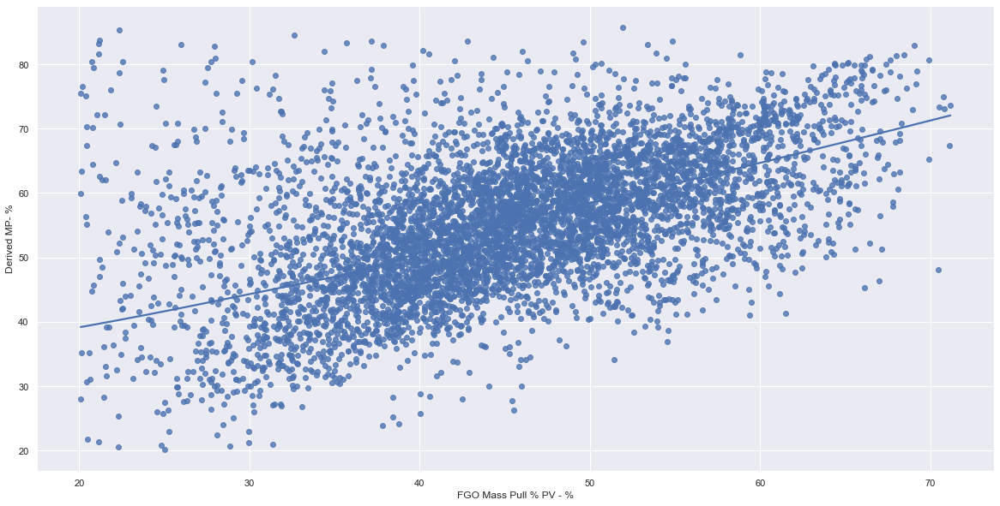

In [37]:
   
fig=plt.figure()
x=df_trial['FGO Mass Pull % PV - %'].values
y=df_trial['Derived MP- %'].values
#     #regression part
#     slope, intercept, r_value, p_value, std_err = stats.linregress(x,y)
#     line = slope*x+intercept
#     plt.plot(x, line, 'r', label='y={:.2f}x+{:.2f}'.format(slope,intercept))
ax = sns.regplot(x, y, data=df_trial,lowess=True)
ax.set(xlabel='FGO Mass Pull % PV - %', ylabel='Derived MP- %')
   # plt.legend(fontsize=20)
#pp.savefig(fig)
plt.show()


In [62]:
NumericDtype(df_trial)

In [ ]:
df_p.columns

In [ ]:
df_comb=pd.DataFrame()


In [ ]:
#df_m['FGO Conc Flow Controller']= df_p['FGO Conc Flow Controller'].values
df_p.head()

In [ ]:
df_p.isnull().sum()

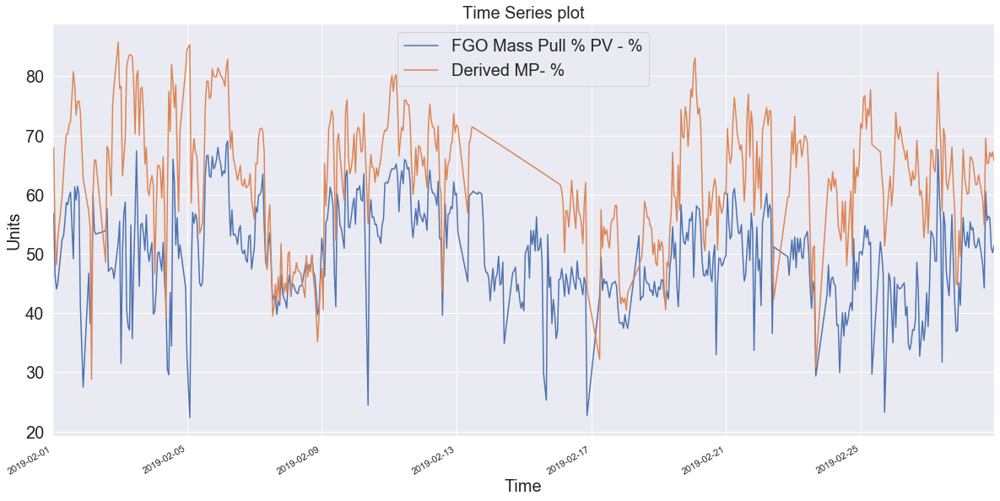

In [38]:
ax = df_trial.loc['2019-02',  'FGO Mass Pull % PV - %'].plot()
ax=df_trial.loc['2019-02', 'Derived MP- %'].plot()
#ax = df2.loc['2019-05-06', 'FGO:PU1750:WY4056_MPULL_C'].plot()
ax.set(title="Time Series plot",
      xlabel='Time', ylabel='Units') 
ax.legend(fontsize=20)
for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
              ax.get_yticklabels()):
    item.set_fontsize(20)
ax.tick_params(axis='both', which='minor', labelsize=20)

In [ ]:
fig = plt.figure(figsize=(20,10))
plt.subplot(2, 2, 1)
plt.plot( df_m.loc['2019-08-5','FGO Mass Pull % PV'])
ax.set(title="Time Series plot",
      xlabel='Time', ylabel='Units') 
ax.legend(fontsize=20)
plt.subplot(2, 2, 2)
plt.plot( df_p.loc['2019-08-5','FGO Conc Flow Controller'])
plt.show()

In [ ]:
df_plot.columns

In [ ]:

ax = df_plot.loc['2019-09',  'feed + water feed -  m3/hr'].plot()
ax = df_plot.loc['2019-09' , 'Conc + tail -  m3/hr'].plot()
#ax = df_plot.loc['2019-09-21':'2019-09-30', 'FGO Tails Flow Controller PV -  m3/hr'].plot()
#ax = df2.loc['2019-05-06', 'FGO:PU1750:WY4056_MPULL_C'].plot()
ax.set(title="Time Series plot",
        xlabel='Time', ylabel='Units') 
ax.legend(fontsize=20)
for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
              ax.get_yticklabels()):
    item.set_fontsize(20)
ax.tick_params(axis='both', which='minor', labelsize=20)

In [ ]:
df_plot['Conc + tail -  m3/hr'] = df_plot['FGO Conc Flow Controller PV -  m3/hr'] + df_plot['FGO Tails Flow Controller PV -  m3/hr']

df_plot['feed + water feed -  m3/hr'] = df_plot['FGO FLTS FD TNK WTR FLW CONTROL MEAS -  m3/hr'] + df_plot['Rougher to Float Flow Ctrl PV - m3/h']






In [ ]:
plt.subplot(2, 1, 1)
ax = df_plot.loc['2019-09','TOTAL GT2 slurry feed GT2 TANK - T/H'].plot()
ax.set(title = "Timeseries Plot",ylabel='Units')
ax.legend(fontsize=20)
for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
              ax.get_yticklabels()):
    item.set_fontsize(20)
plt.subplot(2, 1, 2)
ax = df_plot.loc['2019-09' ,  'TOTAL GT2 flow rate FEED TANK - m3/H'].plot()
#ax = df_plot.loc['2019-09-21':'2019-09-30', 'FGO Tails Flow Controller PV -  m3/hr'].plot()
#ax = df2.loc['2019-05-06', 'FGO:PU1750:WY4056_MPULL_C'].plot()
#ax.set(title="Time Series plot",
ax.set( xlabel='Time', ylabel='Units') 
ax.legend(fontsize=20)
for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
              ax.get_yticklabels()):
    item.set_fontsize(20)
ax.tick_params(axis='both', which='minor', labelsize=20)

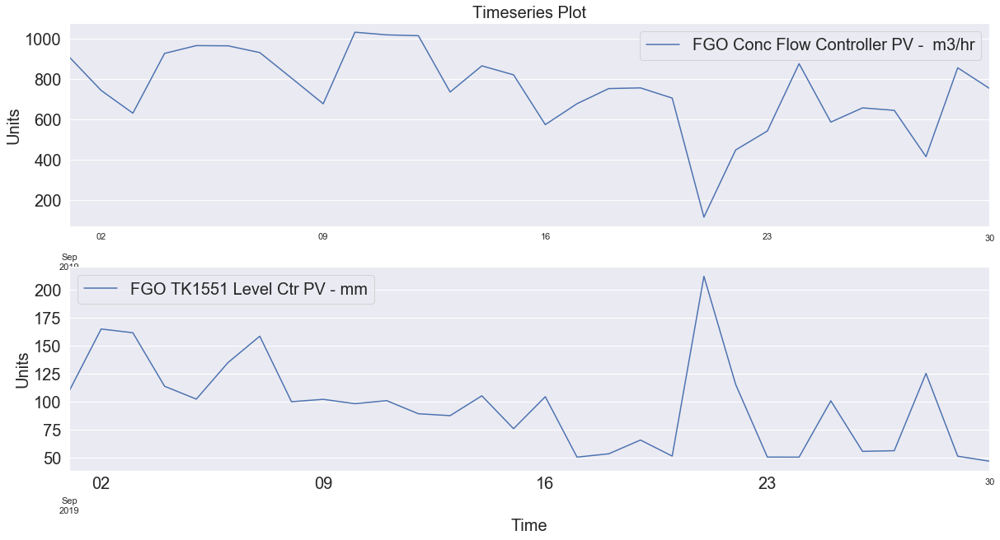

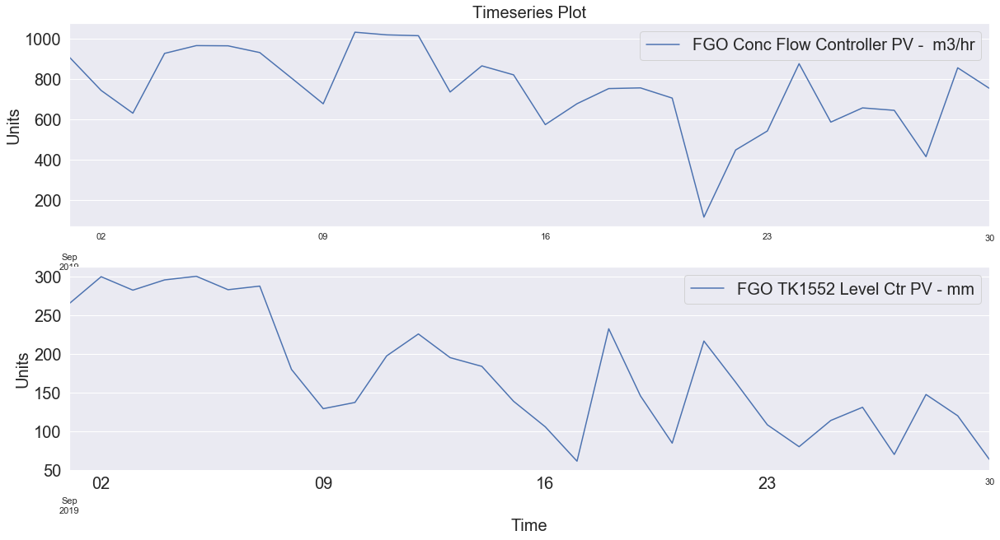

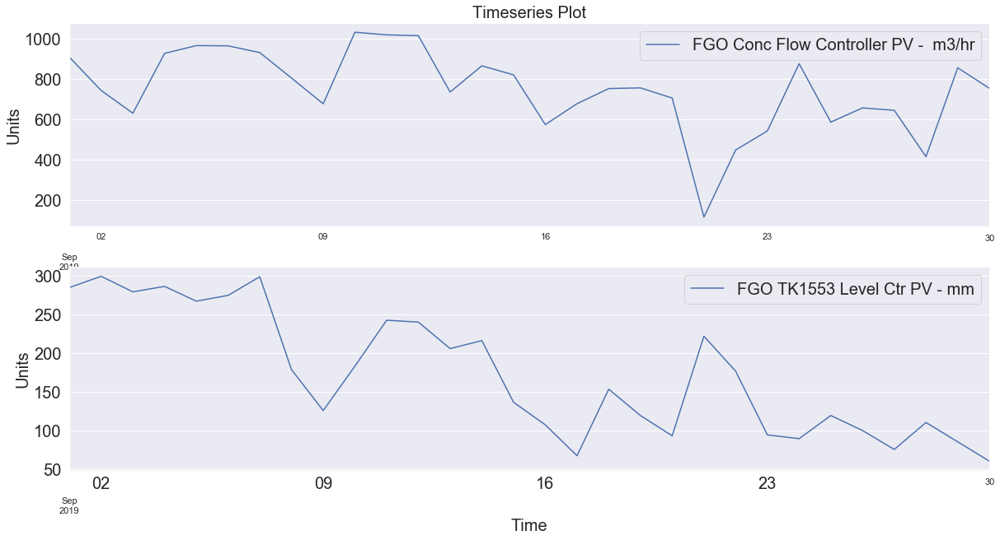

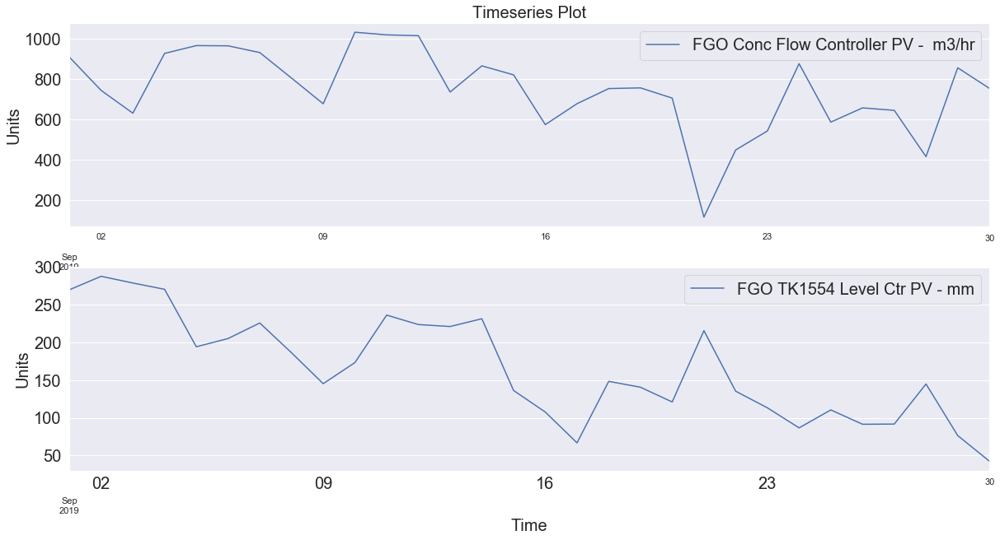

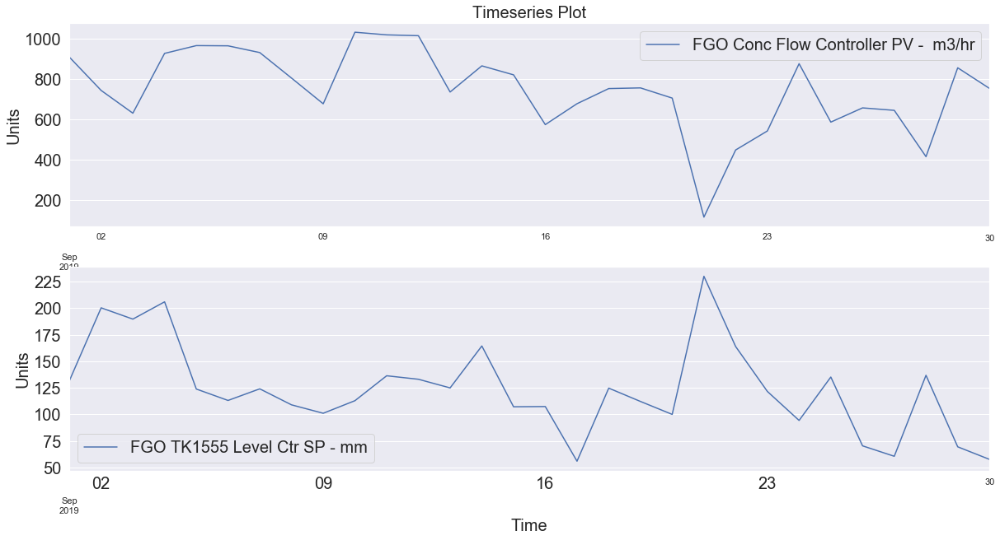

...

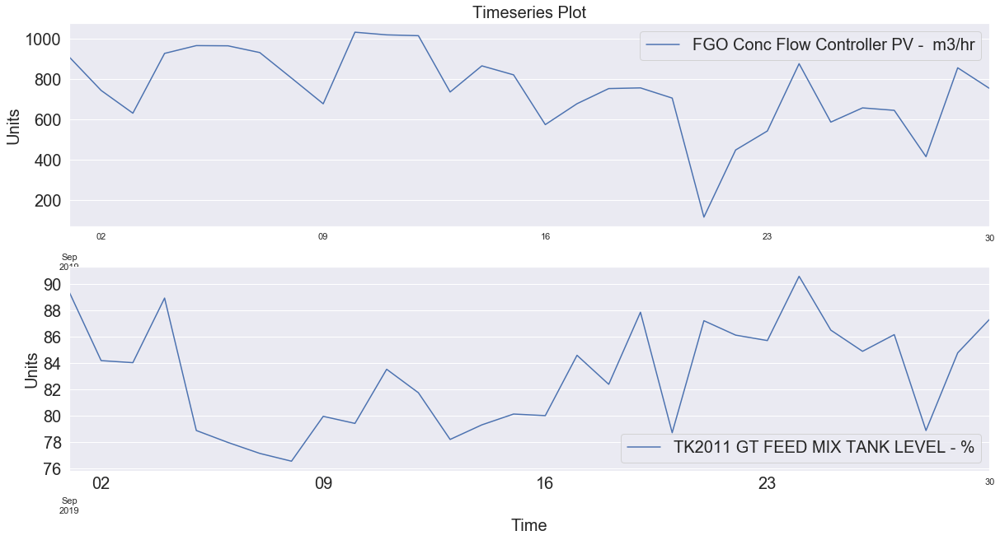

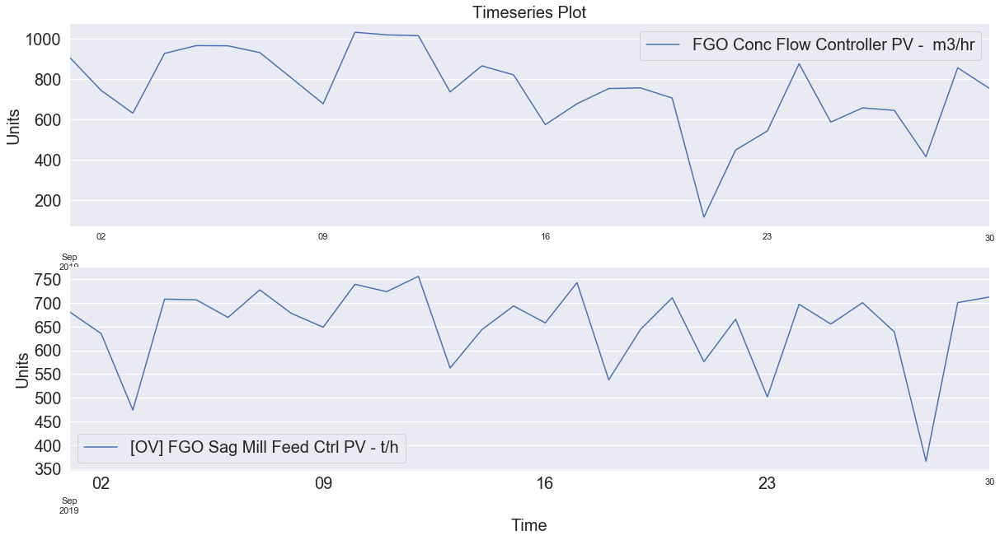

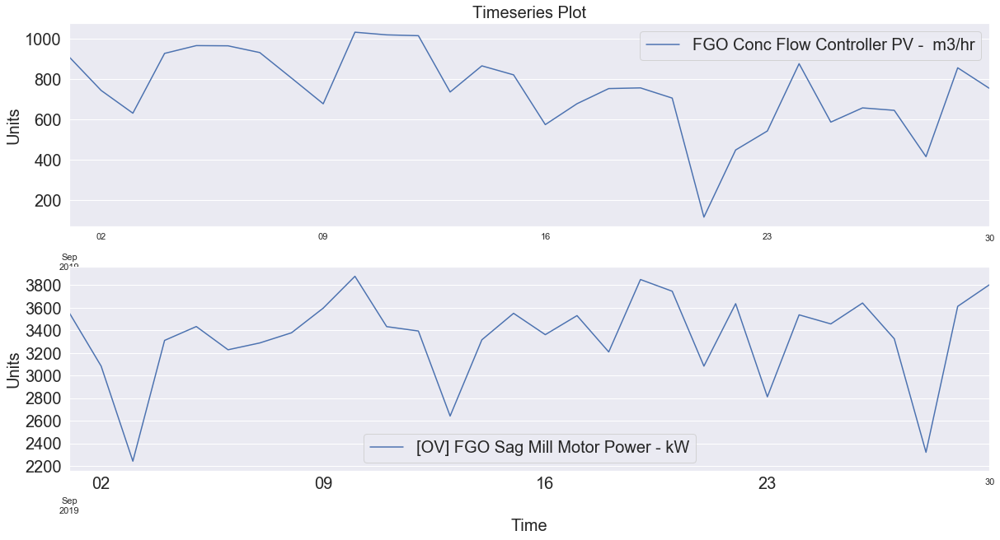

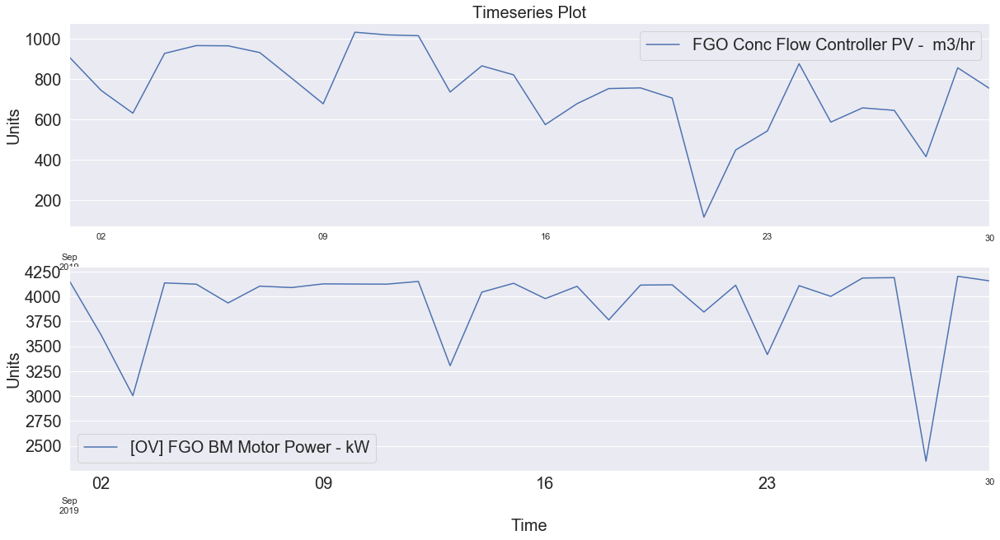

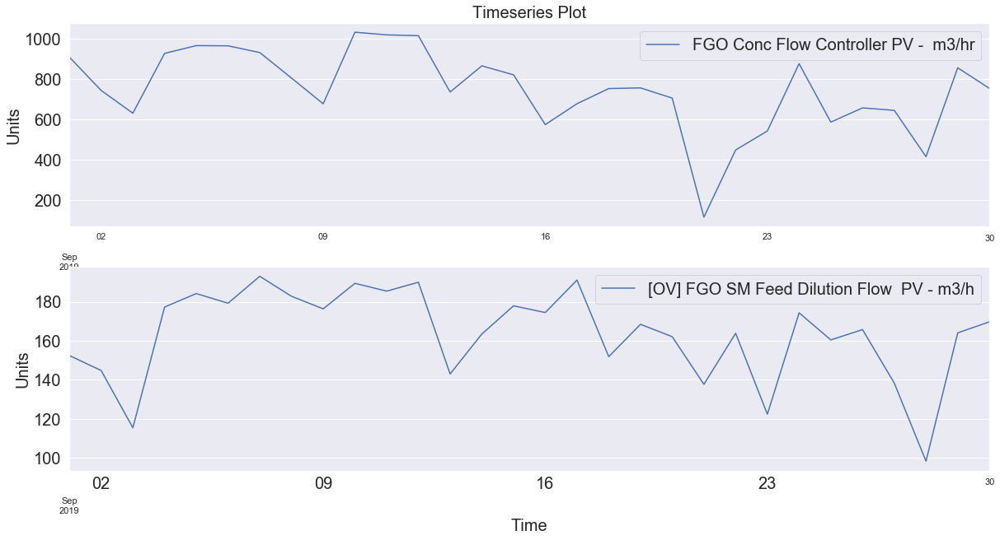

In [134]:
fig_list= list(df_plot)
pp = PdfPages('Timeseries_plots_Daily.pdf')
for i in fig_list:
    fig_n=plt.figure(i)
    plt.subplot(2, 1, 1)
    ax = df_plot.loc['2019-09',  'FGO Conc Flow Controller PV -  m3/hr'].plot()
    ax.set(title = "Timeseries Plot",ylabel='Units')
    ax.legend(fontsize=20)
    for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
              ax.get_yticklabels()):
        item.set_fontsize(20)
    plt.subplot(2, 1, 2)
    ax = df_plot.loc['2019-09' , (i)].plot()
#ax = df_plot.loc['2019-09-21':'2019-09-30', 'FGO Tails Flow Controller PV -  m3/hr'].plot()
#ax = df2.loc['2019-05-06', 'FGO:PU1750:WY4056_MPULL_C'].plot()
#ax.set(title="Time Series plot",
    ax.set( xlabel='Time', ylabel='Units') 
    ax.legend(fontsize=20)
    for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
              ax.get_yticklabels()):
        item.set_fontsize(20)
    ax.tick_params(axis='both', which='minor', labelsize=20)
    pp.savefig(fig_n)
    plt.show()
pp.close()

In [ ]:
dfs=np.split(df_plot,[20], axis=1)

In [ ]:
df_plot.shape

In [ ]:
df_19=dfs[1].copy()

In [ ]:
df_19['FGO Conc Flow Controller PV -  m3/hr']=df_20['FGO Conc Flow Controller PV -  m3/hr']

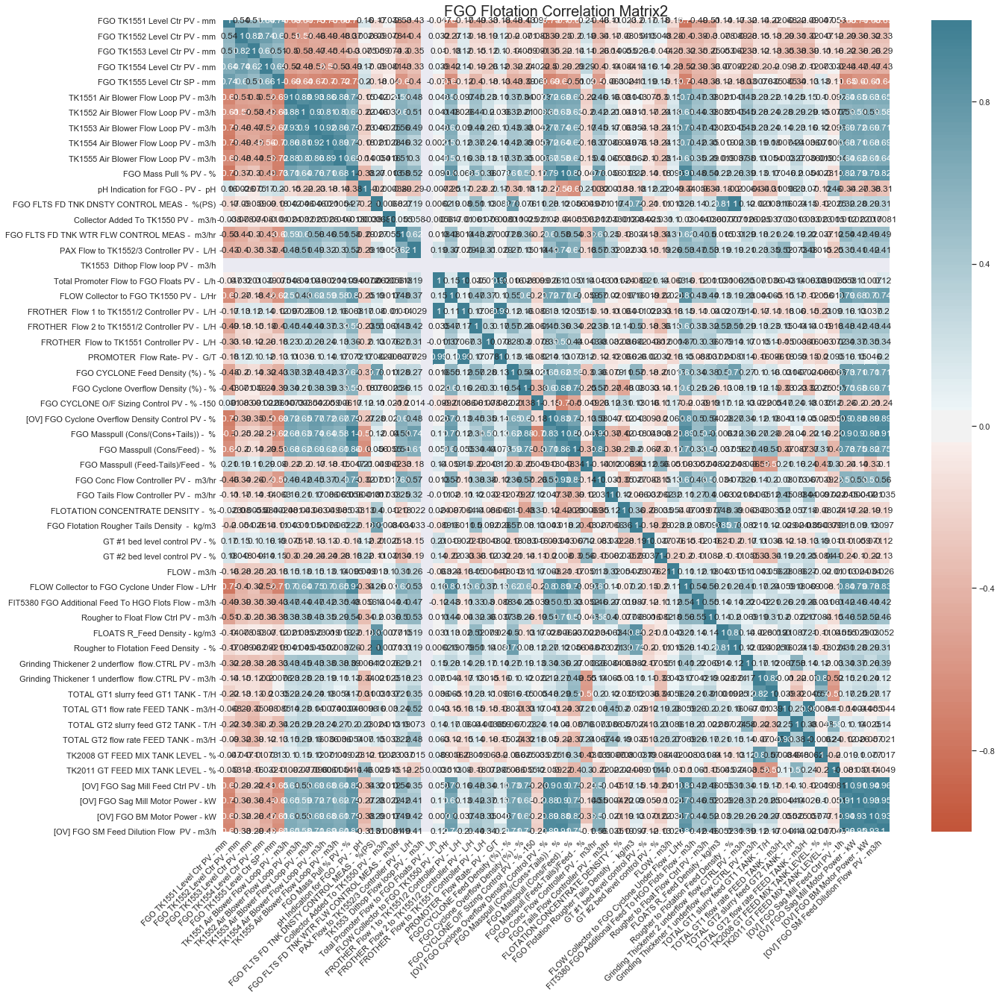

In [135]:
#df_25=df_25.drop(['PAX Dosing to TK3603/4 - Actual - g/t','PAX Flow control to TK3603/4 - PV - l/h','HGO ROUGHER FLOT CONCENTRATE MASS PULL - T/h',
      # 'HGO ROUGHER FLOT TAILINGS MASS PULL - T/h'], axis=1)
corr = df_plot.corr()
fig, ax = plt.subplots(figsize=(20,20)) 
ax = sns.heatmap(
    corr, annot=True,
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=False, ax=ax
)
ax.set_title('FGO Flotation Correlation Matrix2', fontsize=20)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

In [136]:
corr.to_csv('FGO_correlation_data_Daily.csv')

In [137]:
## calculating summary ##
def summary5point(dataframe):
    perc=[0.25,0.50,0.75]
    include=['object', 'float', 'int']
    desc = dataframe.describe(percentiles = perc, include = include)
    #dataframe=str(dataframe)
    desc.to_csv('dataframe'+'.csv')
    return;

In [138]:
summary5point(df_plot)

In [ ]:
summary_HGO.to_csv('FGO_Summary_data_Daily.csv')

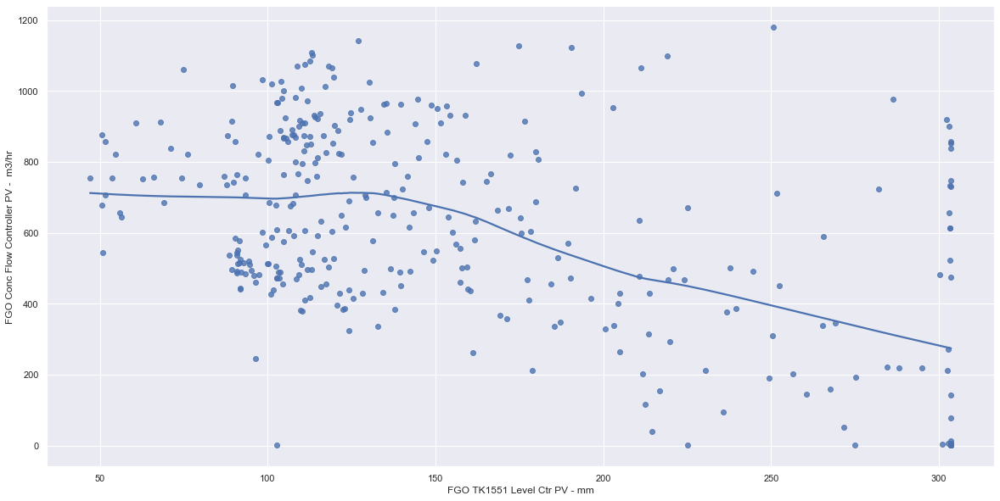

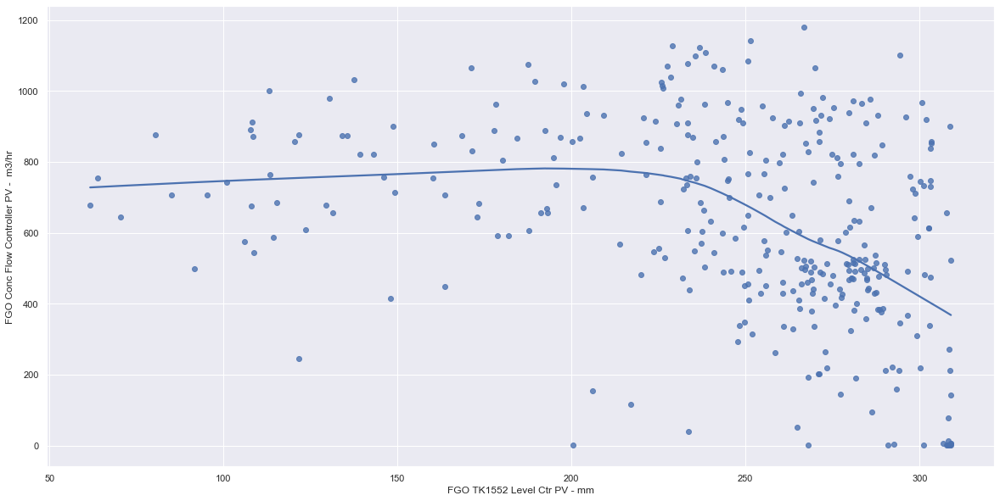

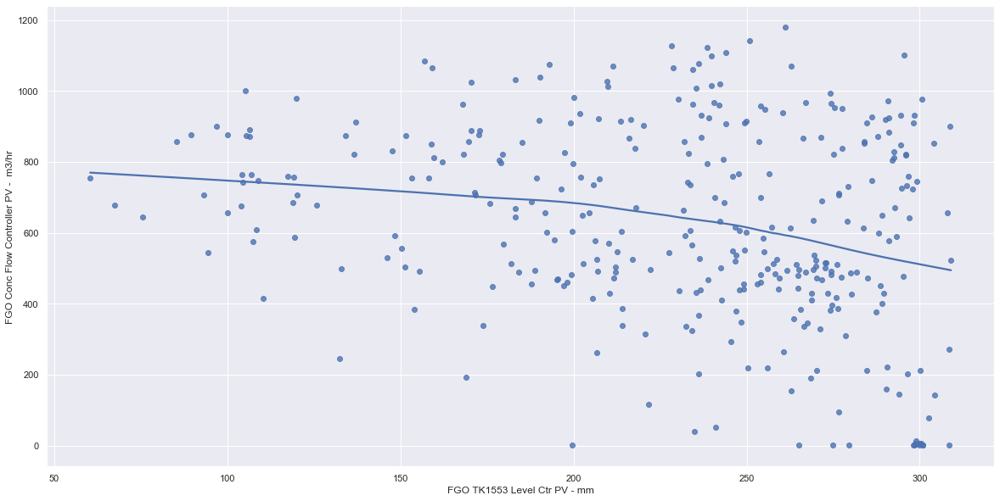

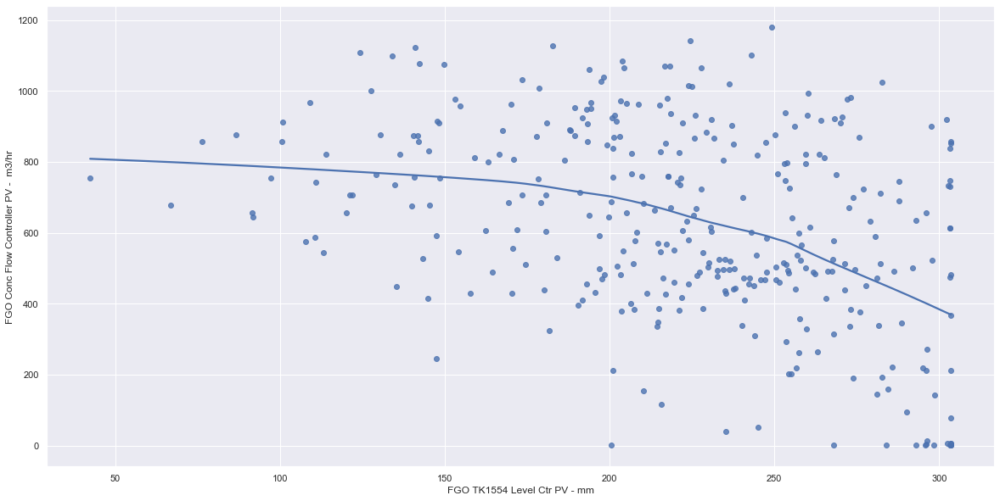

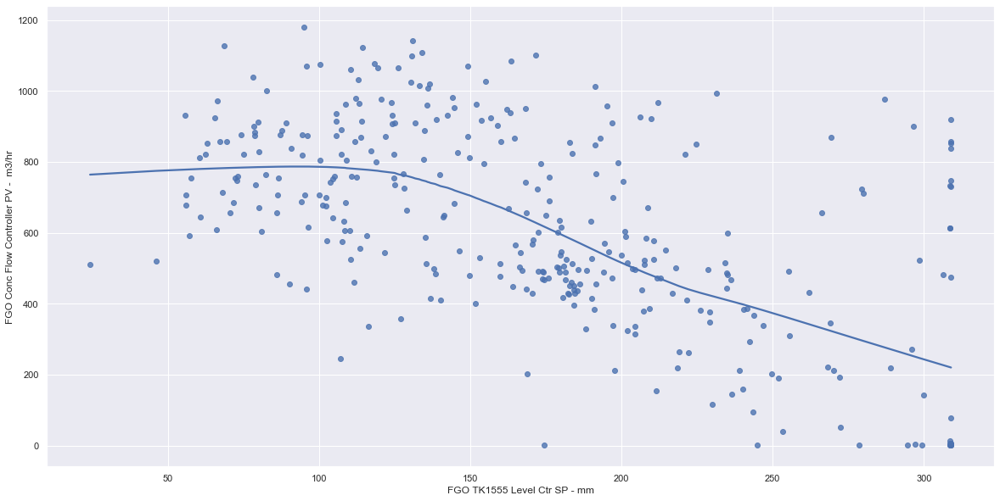

...

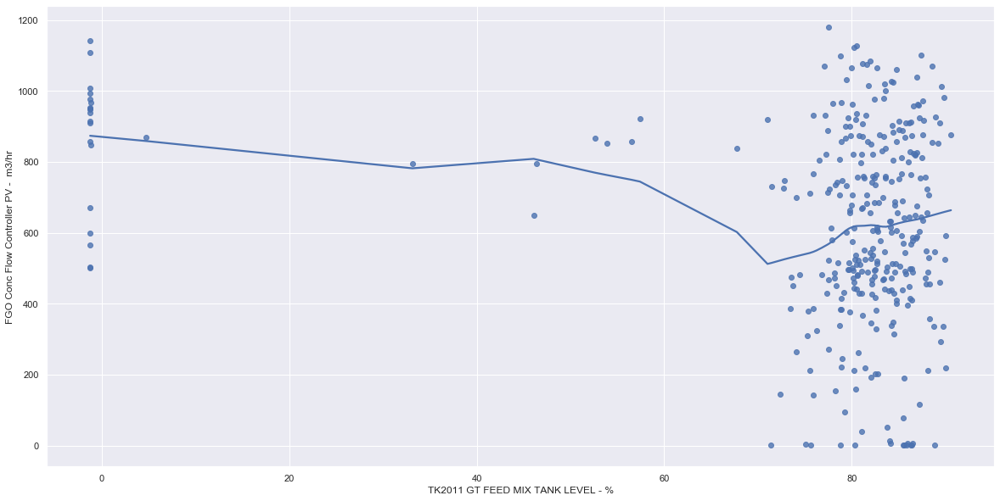

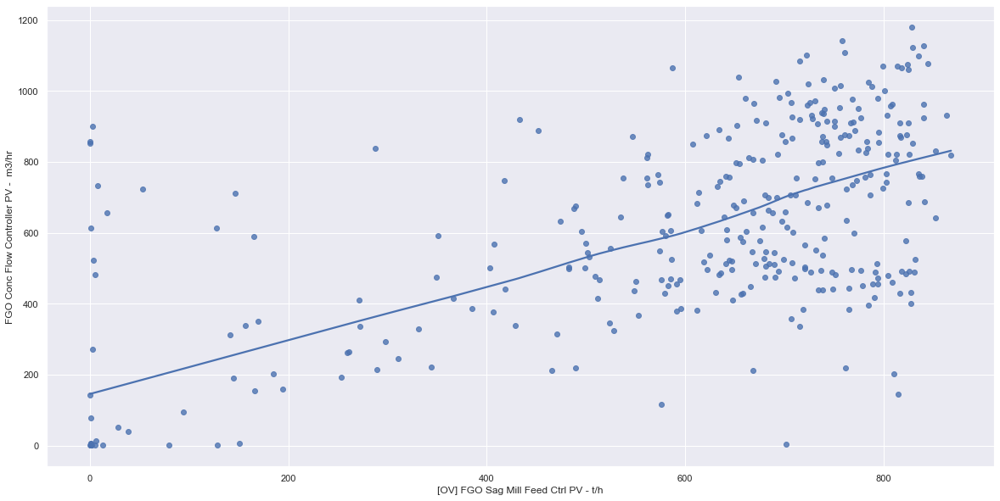

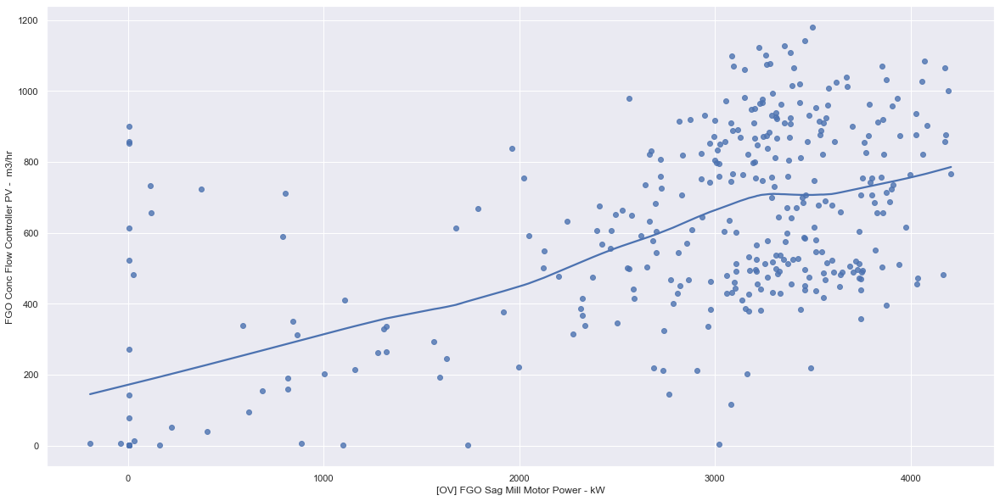

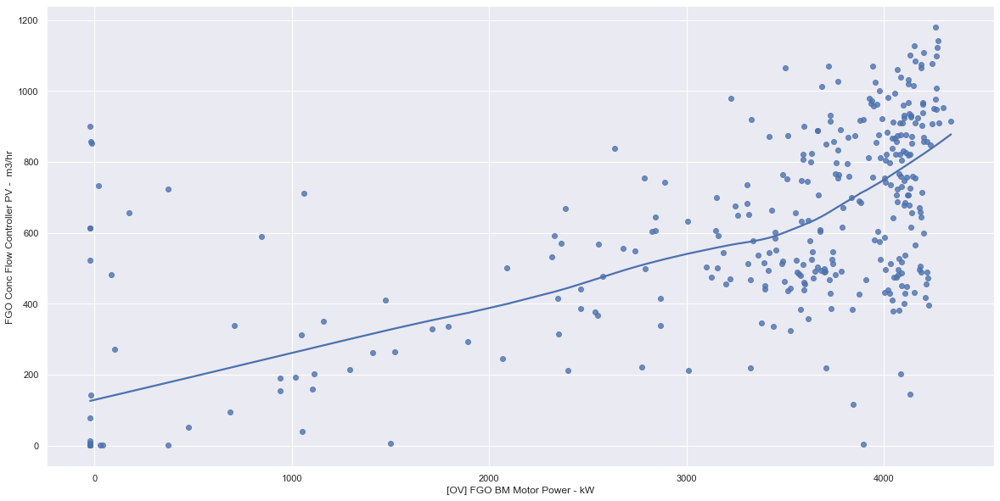

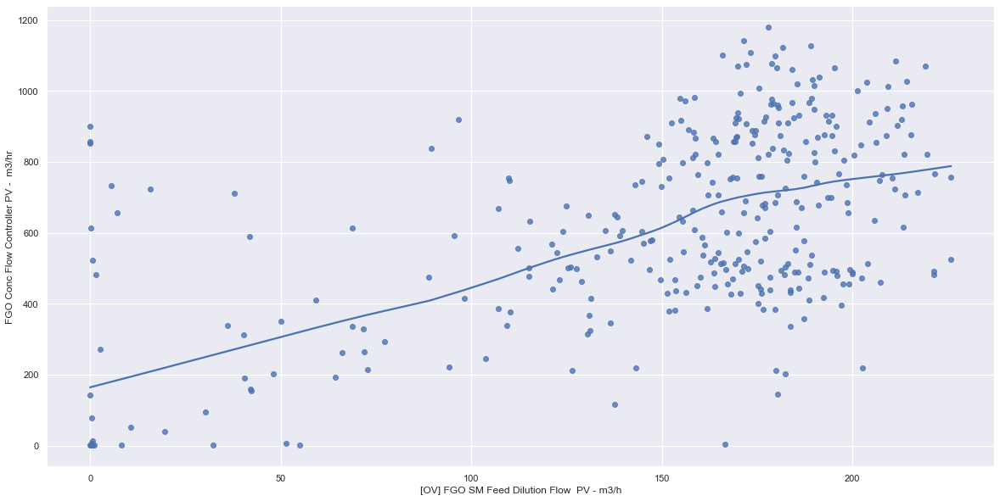

In [109]:
fig_list=list(df_plot)
pp = PdfPages('Daily_BV_Plot_positive.pdf')

for i in fig_list:
    df_plot=df_plot.dropna(how='all',axis=1)
    fig=plt.figure(i)
    x=df_plot[i].values
    y=df_plot['FGO Conc Flow Controller PV -  m3/hr'].values
#     #regression part
#     slope, intercept, r_value, p_value, std_err = stats.linregress(x,y)
#     line = slope*x+intercept
#     plt.plot(x, line, 'r', label='y={:.2f}x+{:.2f}'.format(slope,intercept))
    ax = sns.regplot(x, y, data=df_plot,lowess=True)
    ax.set(xlabel=(i), ylabel='FGO Conc Flow Controller PV -  m3/hr')
   # plt.legend(fontsize=20)
    pp.savefig(fig)
    plt.show()
pp.close()

In [70]:
df_trial=df_plot.copy()

In [71]:
df_trial.mask(df_trial<0)

,FGO TK1551 Level Ctr PV - mm,FGO TK1552 Level Ctr PV - mm,FGO TK1553 Level Ctr PV - mm,FGO TK1554 Level Ctr PV - mm,FGO TK1555 Level Ctr SP - mm,TK1551 Air Blower Flow Loop PV - m3/h,TK1552 Air Blower Flow Loop PV - m3/h,TK1553 Air Blower Flow Loop PV - m3/h,TK1554 Air Blower Flow Loop PV - m3/h,TK1555 Air Blower Flow Loop PV - m3/h,...,TOTAL GT1 slurry feed GT1 TANK - T/H,TOTAL GT1 flow rate FEED TANK - m3/H,TOTAL GT2 slurry feed GT2 TANK - T/H,TOTAL GT2 flow rate FEED TANK - m3/H,TK2008 GT FEED MIX TANK LEVEL - %,TK2011 GT FEED MIX TANK LEVEL - %,[OV] FGO Sag Mill Feed Ctrl PV - t/h,[OV] FGO Sag Mill Motor Power - kW,[OV] FGO BM Motor Power - kW,[OV] FGO SM Feed Dilution Flow PV - m3/h
2018-10-01,303.622221,303.357603,303.958232,303.500759,309.000824,7.598247,NaN,0.742188,0.156250,NaN,...,0.000000,2009.535327,NaN,2012.374904,69.277435,53.911933,0.101021,5.057575,NaN,NaN
2018-10-02,303.602247,303.343898,283.882249,303.476439,309.000824,7.872897,NaN,0.710863,0.156250,NaN,...,146.805282,2384.687258,NaN,2530.389065,69.371456,56.538413,0.113267,5.282382,NaN,NaN
2018-10-03,303.470933,303.163975,277.624574,303.303826,309.000824,7.679120,NaN,0.732478,0.156250,NaN,...,225.789921,577.754357,17.772550,1808.656149,74.118138,67.744337,287.773405,1964.530526,2633.055234,89.509148
2018-10-04,303.444305,303.133026,286.219419,303.273102,309.000824,7.825945,NaN,0.742188,0.156250,NaN,...,425.320508,1345.847193,254.133389,1427.993920,75.424642,72.828164,417.455757,3244.226730,4100.592779,109.867342
2018-10-05,303.444305,303.133026,277.316857,303.273102,309.000824,8.165213,NaN,0.742188,0.156250,NaN,...,352.634661,827.992023,307.906596,1503.264829,78.294261,73.528855,348.797199,2374.385677,3127.445051,88.691187
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-09-26,55.849523,131.338868,100.021635,91.459265,70.456979,823.076788,842.788886,848.472382,724.315275,538.216372,...,837.082337,4320.701421,1192.480142,5619.132995,83.515658,84.894654,700.357242,3640.985417,4185.506019,165.729383
2019-09-27,56.445709,70.380544,75.583123,91.724568,60.626315,821.571138,732.225981,814.929919,709.774260,526.580127,...,448.464494,3747.139278,1071.779040,4891.608111,78.609008,86.158370,638.884536,3325.140022,4189.304266,138.298806
2019-09-28,125.540394,147.877386,110.389561,144.896201,136.878953,728.819385,691.957252,766.141160,710.888753,586.015982,...,316.008759,2795.299948,753.735032,3684.482164,73.630009,78.893575,366.099287,2321.414706,2345.780035,98.234856
2019-09-29,51.511740,120.363326,85.424177,76.446237,69.525600,856.349989,873.754572,862.897266,822.629512,732.682620,...,878.668643,5064.975005,1159.615973,6198.426384,87.135917,84.779690,700.568683,3611.831218,4202.846181,164.047026


In [72]:
NumericDtype(df_trial)